# Análise de Clusters de Risco de Obesidade

## Objetivo

Será realizada uma segmentação poferecer perfis alvo para focos de políticas públicas de saúde. O estudo será feito a partir dos dados coletados sobre hábitos de alimentação e condições físicas de populações do México, Peru and Colômbia, usando dados coletados de uma plataforma web com uma pesquisa de usuários anônimos.

## Dataset

Origem (Kaggle): https://www.kaggle.com/competitions/playground-series-s4e2/overview
    
Colunas: 

Atributos gerais: id, Gender, Height, Weight, family_history_with_overweight, 

Atributos relacionados aos hábitos alimentares: Frequent consumption of high caloric food (FAVC), Frequency of consumption of vegetables (FCVC), Number of main meals (NCP), Consumption of food between meals (CAEC), Consumption of water daily (CH20), and Consumption of alcohol (CALC). 

Atributos relacionados à condição física: Calories consumption monitoring (SCC), Physical activity frequency (FAF), Time using technology devices (TUE), Transportation used (MTRANS), Obesity level (NObeyesdad)

## Ambiente

In [68]:
# Imports
import threadpoolctl
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import sklearn
from scipy import stats
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.decomposition import PCA
from mpl_toolkits.mplot3d import Axes3D
import plotly.express as px
px.defaults.template = "plotly_white"
import warnings
warnings.filterwarnings('ignore')

## Carregamento dos dados

In [69]:
df = pd.read_csv('train.csv')

In [70]:
df

,id,Gender,Age,Height,Weight,family_history_with_overweight,FAVC,FCVC,NCP,CAEC,SMOKE,CH2O,SCC,FAF,TUE,CALC,MTRANS,NObeyesdad
0,0,Male,24.443011,1.699998,81.669950,yes,yes,2.000000,2.983297,Sometimes,no,2.763573,no,0.000000,0.976473,Sometimes,Public_Transportation,Overweight_Level_II
1,1,Female,18.000000,1.560000,57.000000,yes,yes,2.000000,3.000000,Frequently,no,2.000000,no,1.000000,1.000000,no,Automobile,Normal_Weight
2,2,Female,18.000000,1.711460,50.165754,yes,yes,1.880534,1.411685,Sometimes,no,1.910378,no,0.866045,1.673584,no,Public_Transportation,Insufficient_Weight
3,3,Female,20.952737,1.710730,131.274851,yes,yes,3.000000,3.000000,Sometimes,no,1.674061,no,1.467863,0.780199,Sometimes,Public_Transportation,Obesity_Type_III
4,4,Male,31.641081,1.914186,93.798055,yes,yes,2.679664,1.971472,Sometimes,no,1.979848,no,1.967973,0.931721,Sometimes,Public_Transportation,Overweight_Level_II
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20753,20753,Male,25.137087,1.766626,114.187096,yes,yes,2.919584,3.000000,Sometimes,no,2.151809,no,1.330519,0.196680,Sometimes,Public_Transportation,Obesity_Type_II
20754,20754,Male,18.000000,1.710000,50.000000,no,yes,3.000000,4.000000,Frequently,no,1.000000,no,2.000000,1.000000,Sometimes,Public_Transportation,Insufficient_Weight
20755,20755,Male,20.101026,1.819557,105.580491,yes,yes,2.407817,3.000000,Sometimes,no,2.000000,no,1.158040,1.198439,no,Public_Transportation,Obesity_Type_II
20756,20756,Male,33.852953,1.700000,83.520113,yes,yes,2.671238,1.971472,Sometimes,no,2.144838,no,0.000000,0.973834,no,Automobile,Overweight_Level_II


## Pré-processamento

In [71]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20758 entries, 0 to 20757
Data columns (total 18 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              20758 non-null  int64  
 1   Gender                          20758 non-null  object 
 2   Age                             20758 non-null  float64
 3   Height                          20758 non-null  float64
 4   Weight                          20758 non-null  float64
 5   family_history_with_overweight  20758 non-null  object 
 6   FAVC                            20758 non-null  object 
 7   FCVC                            20758 non-null  float64
 8   NCP                             20758 non-null  float64
 9   CAEC                            20758 non-null  object 
 10  SMOKE                           20758 non-null  object 
 11  CH2O                            20758 non-null  float64
 12  SCC                             

In [72]:
df['Gender'] = df['Gender'].map({'Male':0, 'Female':1})

In [73]:
df['family_history_with_overweight'] = df['family_history_with_overweight'].map({'no':0, 'yes':1})

In [74]:
df['FAVC'] = df['FAVC'].map({'no':0, 'yes':1})

In [75]:
df['CAEC'].unique()

array(['Sometimes', 'Frequently', 'no', 'Always'], dtype=object)

In [76]:
df['CAEC'] = df['CAEC'].map({'no':0, 'Sometimes':0.25, 'Frequently':0.75, 'Always':1})

In [77]:
df['SMOKE'].unique()

array(['no', 'yes'], dtype=object)

In [78]:
df['SMOKE'] = df['SMOKE'].map({'no':0, 'yes':1})

In [79]:
df['SCC'].unique()

array(['no', 'yes'], dtype=object)

In [80]:
df['SCC'] = df['SCC'].map({'no':0, 'yes':1})

In [81]:
df['CALC'].unique()

array(['Sometimes', 'no', 'Frequently'], dtype=object)

In [82]:
df['CALC'] = df['CALC'].map({'no':0, 'Sometimes':0.25, 'Frequently':0.75, 'Always':1})

In [83]:
df['MTRANS'].unique()

array(['Public_Transportation', 'Automobile', 'Walking', 'Motorbike',
       'Bike'], dtype=object)

In [84]:
df['MTRANS'] = df['MTRANS'].map({'Automobile':0, 'Motorbike':0, 'Public_Transportation':1, 'Walking':2})

In [85]:
df['NObeyesdad'].unique()

array(['Overweight_Level_II', 'Normal_Weight', 'Insufficient_Weight',
       'Obesity_Type_III', 'Obesity_Type_II', 'Overweight_Level_I',
       'Obesity_Type_I'], dtype=object)

In [86]:
df['NObeyesdad'] = df['NObeyesdad'].map({'Insufficient_Weight':16, 'Normal_Weight': 20.5, 'Overweight_Level_I': 26.25, 'Overweight_Level_II':28.75, 'Obesity_Type_I':32.5, 'Obesity_Type_II':37.5, 'Obesity_Type_III':42.5})

In [87]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20758 entries, 0 to 20757
Data columns (total 18 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              20758 non-null  int64  
 1   Gender                          20758 non-null  int64  
 2   Age                             20758 non-null  float64
 3   Height                          20758 non-null  float64
 4   Weight                          20758 non-null  float64
 5   family_history_with_overweight  20758 non-null  int64  
 6   FAVC                            20758 non-null  int64  
 7   FCVC                            20758 non-null  float64
 8   NCP                             20758 non-null  float64
 9   CAEC                            20758 non-null  float64
 10  SMOKE                           20758 non-null  int64  
 11  CH2O                            20758 non-null  float64
 12  SCC                             

In [88]:
df.describe()

,id,Gender,Age,Height,Weight,family_history_with_overweight,FAVC,FCVC,NCP,CAEC,SMOKE,CH2O,SCC,FAF,TUE,CALC,MTRANS,NObeyesdad
count,20758.00000,20758.000000,20758.000000,20758.000000,20758.000000,20758.000000,20758.000000,20758.000000,20758.000000,20758.000000,20758.000000,20758.000000,20758.000000,20758.000000,20758.000000,20758.000000,20726.000000,20758.000000
mean,10378.50000,0.502071,23.841804,1.700245,87.887768,0.819636,0.914443,2.445908,2.761332,0.323454,0.011803,2.029418,0.033096,0.981747,0.616756,0.200561,0.850188,30.257985
std,5992.46278,0.500008,5.688072,0.087312,26.379443,0.384500,0.279716,0.533218,0.705375,0.195374,0.108000,0.608467,0.178891,0.838302,0.602113,0.139546,0.415260,8.895290
min,0.00000,0.000000,14.000000,1.450000,39.000000,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,16.000000
25%,5189.25000,0.000000,20.000000,1.631856,66.000000,1.000000,1.000000,2.000000,3.000000,0.250000,0.000000,1.792022,0.000000,0.008013,0.000000,0.250000,1.000000,20.500000
50%,10378.50000,1.000000,22.815416,1.700000,84.064875,1.000000,1.000000,2.393837,3.000000,0.250000,0.000000,2.000000,0.000000,1.000000,0.573887,0.250000,1.000000,28.750000
75%,15567.75000,1.000000,26.000000,1.762887,111.600553,1.000000,1.000000,3.000000,3.000000,0.250000,0.000000,2.549617,0.000000,1.587406,1.000000,0.250000,1.000000,37.500000
max,20757.00000,1.000000,61.000000,1.975663,165.057269,1.000000,1.000000,3.000000,4.000000,1.000000,1.000000,3.000000,1.000000,3.000000,2.000000,0.750000,2.000000,42.500000


In [89]:
df.drop(columns = 'id', inplace = True)

In [90]:
df.corr()

,Gender,Age,Height,Weight,family_history_with_overweight,FAVC,FCVC,NCP,CAEC,SMOKE,CH2O,SCC,FAF,TUE,CALC,MTRANS,NObeyesdad
Gender,1.000000,-0.066530,-0.623507,-0.118613,-0.095786,-0.021812,0.312766,-0.039468,0.051889,-0.063349,-0.053298,0.061442,-0.238399,-0.058696,0.016054,0.114401,0.082657
Age,-0.066530,1.000000,-0.011713,0.283381,0.261575,0.056848,0.034414,-0.048479,-0.172892,0.056006,-0.016325,-0.108855,-0.192259,-0.296154,0.069872,-0.578564,0.348181
Height,-0.623507,-0.011713,1.000000,0.416677,0.228137,0.115566,-0.071546,0.191383,-0.087665,0.069748,0.183706,-0.095923,0.295278,0.076433,0.086410,-0.035584,0.141770
Weight,-0.118613,0.283381,0.416677,1.000000,0.514147,0.228770,0.245682,0.095947,-0.379396,0.040416,0.317914,-0.185116,-0.084845,-0.086471,0.170317,-0.030928,0.920278
family_history_with_overweight,-0.095786,0.261575,0.228137,0.514147,1.000000,0.152154,0.047756,0.044778,-0.247221,0.018782,0.191588,-0.166760,-0.094414,0.005762,-0.006823,-0.123341,0.513173
FAVC,-0.021812,0.056848,0.115566,0.228770,0.152154,1.000000,0.006952,0.011522,-0.126765,-0.016009,0.039167,-0.111897,-0.067030,0.034843,0.055475,-0.052723,0.216944
FCVC,0.312766,0.034414,-0.071546,0.245682,0.047756,0.006952,1.000000,0.113349,0.007017,-0.012191,0.101299,0.022120,-0.089822,-0.147843,0.098919,0.083910,0.288093
NCP,-0.039468,-0.048479,0.191383,0.095947,0.044778,0.011522,0.113349,1.000000,0.079986,0.006820,0.080949,0.006633,0.100871,0.067459,0.083413,0.008997,0.031069
CAEC,0.051889,-0.172892,-0.087665,-0.379396,-0.247221,-0.126765,0.007017,0.079986,1.000000,0.017133,-0.143821,0.112393,0.099041,0.045739,-0.033452,0.075909,-0.409418
SMOKE,-0.063349,0.056006,0.069748,0.040416,0.018782,-0.016009,-0.012191,0.006820,0.017133,1.000000,-0.023475,0.017185,0.008374,-0.016093,0.021937,-0.021357,0.012125


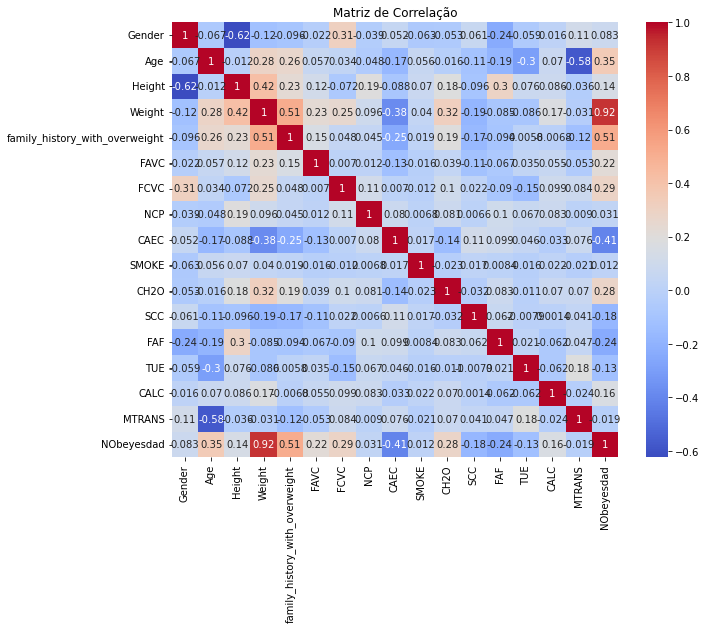

In [91]:
# Plot
plt.figure(figsize = (10,8))
sns.heatmap(df.corr(), annot = True, cmap = 'coolwarm')
plt.title('Matriz de Correlação')
plt.show()

In [92]:
# Função para filtrar e visualizar correlação
def filtrar_e_visualizar_correlacao(df, threshold, drop_column = None):

    # Calcula a matriz de correlação
    corr = df.corr()
    
    # Aplica os filtros de limiar, excluindo a correlação perfeita
    filtro = (abs(corr) >= threshold) & (corr != 1.0)
    df_filtrado = corr.where(filtro).dropna(how = 'all').dropna(axis = 1, how = 'all')
    
    # Remove a coluna e linha especificada, se fornecido
    if drop_column:
        df_filtrado = df_filtrado.drop(index = drop_column, 
                                       errors = 'ignore').drop(columns = drop_column, 
                                                               errors = 'ignore')
    
    # Visualiza o resultado com um heatmap somente com as variáveis que satisfazem o critério de filtro
    plt.figure(figsize = (8, 6))
    sns.heatmap(df_filtrado, annot = True, cmap = 'coolwarm', center = 0)
    plt.show()

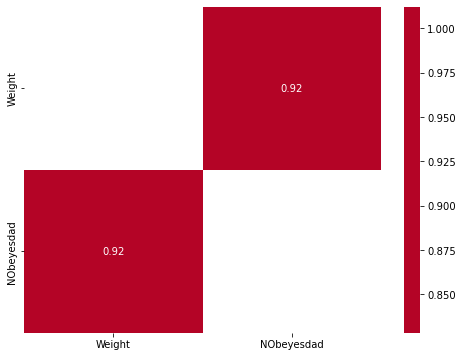

In [123]:
filtrar_e_visualizar_correlacao(df, threshold = 0.65, drop_column = None)


In [94]:
df_novo = df.drop(columns = 'Weight')

In [95]:
df_novo

,Gender,Age,Height,family_history_with_overweight,FAVC,FCVC,NCP,CAEC,SMOKE,CH2O,SCC,FAF,TUE,CALC,MTRANS,NObeyesdad
0,0,24.443011,1.699998,1,1,2.000000,2.983297,0.25,0,2.763573,0,0.000000,0.976473,0.25,1.0,28.75
1,1,18.000000,1.560000,1,1,2.000000,3.000000,0.75,0,2.000000,0,1.000000,1.000000,0.00,0.0,20.50
2,1,18.000000,1.711460,1,1,1.880534,1.411685,0.25,0,1.910378,0,0.866045,1.673584,0.00,1.0,16.00
3,1,20.952737,1.710730,1,1,3.000000,3.000000,0.25,0,1.674061,0,1.467863,0.780199,0.25,1.0,42.50
4,0,31.641081,1.914186,1,1,2.679664,1.971472,0.25,0,1.979848,0,1.967973,0.931721,0.25,1.0,28.75
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20753,0,25.137087,1.766626,1,1,2.919584,3.000000,0.25,0,2.151809,0,1.330519,0.196680,0.25,1.0,37.50
20754,0,18.000000,1.710000,0,1,3.000000,4.000000,0.75,0,1.000000,0,2.000000,1.000000,0.25,1.0,16.00
20755,0,20.101026,1.819557,1,1,2.407817,3.000000,0.25,0,2.000000,0,1.158040,1.198439,0.00,1.0,37.50
20756,0,33.852953,1.700000,1,1,2.671238,1.971472,0.25,0,2.144838,0,0.000000,0.973834,0.00,0.0,28.75


In [96]:
df_novo.isnull().sum()

Gender                             0
Age                                0
Height                             0
family_history_with_overweight     0
FAVC                               0
FCVC                               0
NCP                                0
CAEC                               0
SMOKE                              0
CH2O                               0
SCC                                0
FAF                                0
TUE                                0
CALC                               0
MTRANS                            32
NObeyesdad                         0
dtype: int64

In [97]:
df_novo.dropna(axis = 0, inplace = True)

In [98]:
df_novo.isnull().sum()

Gender                            0
Age                               0
Height                            0
family_history_with_overweight    0
FAVC                              0
FCVC                              0
NCP                               0
CAEC                              0
SMOKE                             0
CH2O                              0
SCC                               0
FAF                               0
TUE                               0
CALC                              0
MTRANS                            0
NObeyesdad                        0
dtype: int64

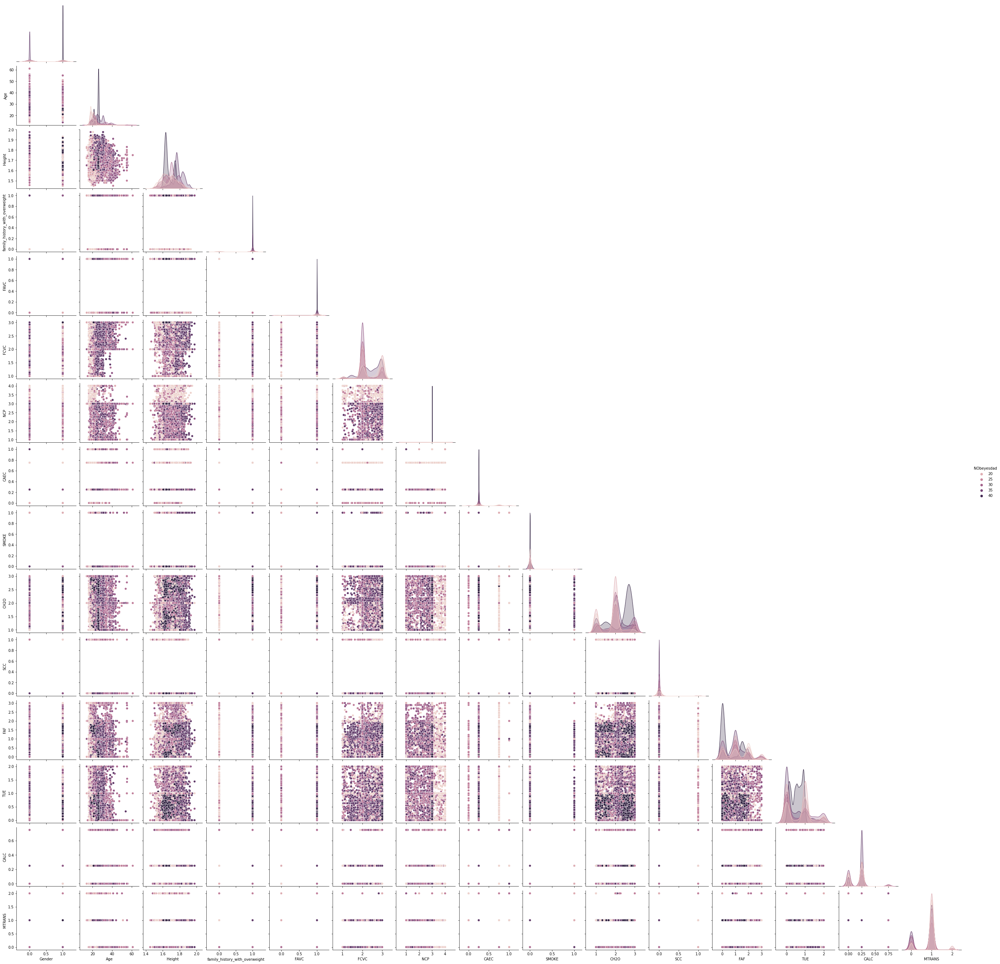

In [33]:
# Visualização de Dados com PairPlot
sns.pairplot(df_novo, hue = 'NObeyesdad', diag_kind = 'kde', corner = True)
plt.show()

In [118]:
df.columns.to_list()

['Gender',
 'Age',
 'Height',
 'Weight',
 'family_history_with_overweight',
 'FAVC',
 'FCVC',
 'NCP',
 'CAEC',
 'SMOKE',
 'CH2O',
 'SCC',
 'FAF',
 'TUE',
 'CALC',
 'MTRANS',
 'NObeyesdad']

In [99]:
# Cria o padronizador
scaler = StandardScaler()
# Padronizando as Variáveis
df_scaled = pd.DataFrame(scaler.fit_transform(df_novo), columns = df_novo.columns)

In [100]:
df_scaled.head()

,Gender,Age,Height,family_history_with_overweight,FAVC,FCVC,NCP,CAEC,SMOKE,CH2O,SCC,FAF,TUE,CALC,MTRANS,NObeyesdad
0,-1.005031,0.105974,-0.002290,0.468469,0.305289,-0.836915,0.314812,-0.375838,-0.108693,1.207212,-0.184739,-1.170963,0.596959,0.355260,0.360775,-0.170561
1,0.994995,-1.027033,-1.605737,0.468469,0.305289,-0.836915,0.338493,2.186118,-0.108693,-0.047703,-0.184739,0.022568,0.636038,-1.438435,-2.047414,-1.097878
2,0.994995,-1.027033,0.128988,0.468469,0.305289,-1.061010,-1.913407,-0.375838,-0.108693,-0.194995,-0.184739,-0.137311,1.754879,-1.438435,0.360775,-1.603687
3,0.994995,-0.507793,0.120628,0.468469,0.305289,1.038892,0.338493,-0.375838,-0.108693,-0.583376,-0.184739,0.580977,0.270943,0.355260,0.360775,1.374968
4,-1.005031,1.371758,2.450881,0.468469,0.305289,0.438003,-1.119746,-0.375838,-0.108693,-0.080822,-0.184739,1.177874,0.522625,0.355260,0.360775,-0.170561


## Redução de dimensionalidade

In [101]:
# Use PCA to reduce dimensions to 3
pca = PCA(n_components=3)
pca.fit(df_scaled)
PCA_df = pd.DataFrame(pca.transform(df_scaled), columns=(["dim1","dim2", "dim3"]))
PCA_df.describe().T

,count,mean,std,min,25%,50%,75%,max
dim1,20726.0,7.188649e-18,1.592102,-4.077877,-1.304705,-0.285210,1.101663,5.896305
dim2,20726.0,-1.595698e-16,1.420789,-3.827797,-1.264373,0.082300,1.151176,4.144189
dim3,20726.0,4.321760e-17,1.272184,-3.806230,-0.893833,-0.135354,0.699513,5.427604


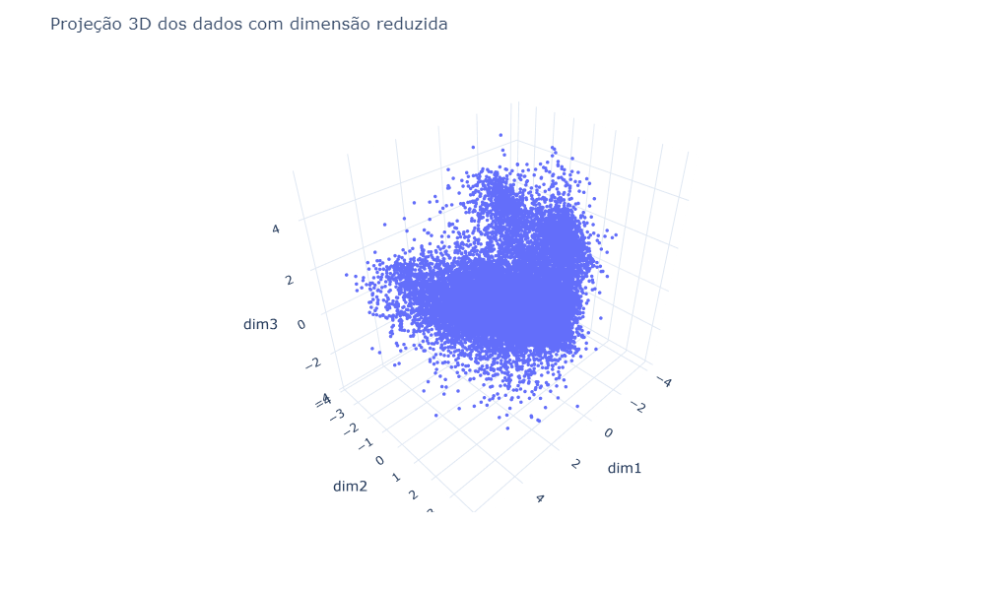

In [102]:
# Plotting the clusters
fig = px.scatter_3d(PCA_df, x='dim1', y='dim2', z='dim3')

# Adjust the size of the data points
fig.update_traces(marker=dict(size=2))

fig.update_layout(title="Projeção 3D dos dados com dimensão reduzida", height=600, width=800)
fig.show()

## Clusterização - Modelo 1

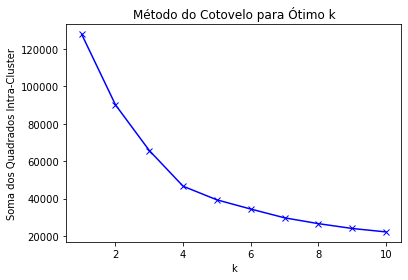

In [104]:
# Lista para armazenar o SSE
sse = []

# Range de valores de k a serem testados
k_range = range(1, 11)

# Testando os valores
for k in k_range:
    kmeans = KMeans(n_clusters = k)
    kmeans.fit(PCA_df)
    sse.append(kmeans.inertia_)

# Plot
plt.plot(k_range, sse, 'bx-')
plt.xlabel('k')
plt.ylabel('Soma dos Quadrados Intra-Cluster')
plt.title('Método do Cotovelo para Ótimo k')
plt.show()

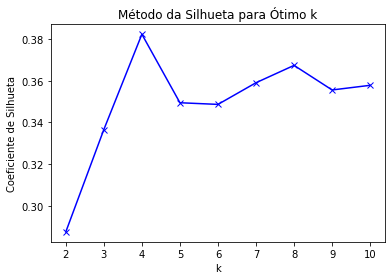

In [105]:
# Lista para o Silhouette score
sil_score = []

# Loop pelo range de valores de k a serem testados
for k in k_range:
    kmeans = KMeans(n_clusters = k)
    kmeans.fit(PCA_df)
    
    # Silhouette score não é definido para k = 1, então filtramos
    if k != 1:
        sil_score.append(silhouette_score(PCA_df, kmeans.labels_))

# Plot
plt.plot(k_range[1:], sil_score, 'bx-')
plt.xlabel('k')
plt.ylabel('Coeficiente de Silhueta')
plt.title('Método da Silhueta para Ótimo k')
plt.show()

In [106]:
# Modelo com 4 clusters
modelo_kmeans = KMeans(n_clusters = 4)

In [107]:
# adding the Clusters feature to the PCA dataframe.
PCA_df['Clusters'] = modelo_kmeans.fit_predict(PCA_df)

# Treina o modelo e salva o resultado em uma coluna do dataframe original
df_novo['cluster'] = modelo_kmeans.fit_predict(PCA_df)

In [108]:
# Amostra aleatória de dados
df_novo.sample(10)

,Gender,Age,Height,family_history_with_overweight,FAVC,FCVC,NCP,CAEC,SMOKE,CH2O,SCC,FAF,TUE,CALC,MTRANS,NObeyesdad,cluster
13443,1,21.000000,1.720000,1,1,2.000000,1.000000,0.25,0,3.000000,0,2.000000,0.000000,0.25,1.0,26.25,1
10978,0,37.965430,1.762887,1,1,2.620963,2.272214,0.25,0,2.284494,0,1.281165,0.325445,0.25,0.0,37.50,0
10982,0,21.979769,1.781543,1,1,2.000000,3.000000,0.25,0,3.000000,0,1.980738,0.000000,0.25,1.0,32.50,1
14733,1,20.951084,1.726606,1,1,3.000000,3.000000,0.25,0,1.816052,0,1.586525,0.857718,0.25,1.0,42.50,3
4338,0,23.000000,1.848845,1,1,2.562100,2.122545,0.25,0,1.984323,0,1.463610,0.000000,0.25,1.0,37.50,1
20422,0,21.000000,1.700000,1,1,2.000000,3.000000,0.25,0,2.000000,0,1.000000,1.000000,0.25,2.0,20.50,1
17209,0,21.793724,1.700216,1,1,2.000000,3.000000,0.25,0,2.000000,0,2.352091,1.425852,0.00,1.0,28.75,1
12406,1,19.084967,1.683950,1,1,3.000000,3.000000,0.25,0,2.846259,0,1.465250,0.691944,0.25,1.0,42.50,3
698,0,18.000000,1.720000,0,1,3.000000,3.000000,0.75,0,2.000000,0,0.000000,1.000000,0.25,1.0,20.50,2
17700,1,19.000000,1.650000,1,1,2.000000,3.000000,0.25,0,2.000000,0,1.000000,1.000000,0.25,1.0,26.25,1


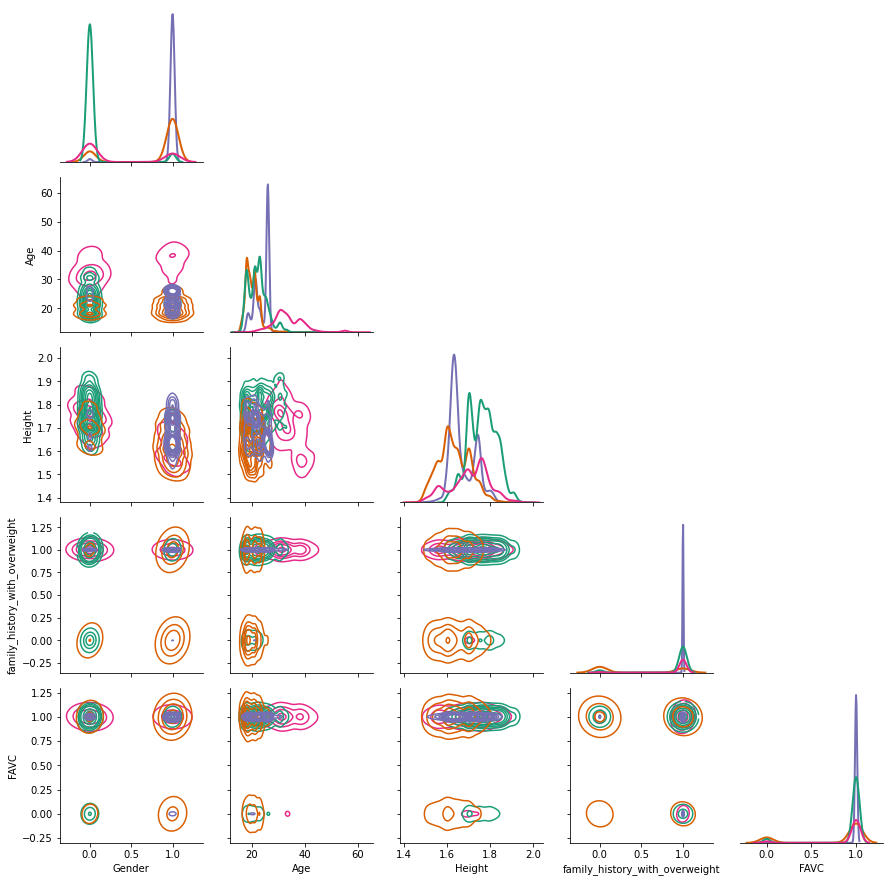

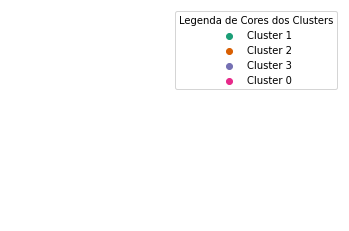

In [109]:
# Criando um mapa de cores baseado na paleta 'Dark2'
palette = sns.color_palette('Dark2', n_colors = len(df_novo['cluster'].unique()))
color_map = dict(zip(df_novo['cluster'].unique(), palette))

# Plotando o gráfico de grid com os clusters e mostrando o mapa de cores
g = sns.PairGrid(df_novo, vars = ['Gender', 'Age', 'Height', 'family_history_with_overweight', 'FAVC'],hue = 'cluster', palette = color_map, diag_sharey = False, corner = True)
g.map_lower(sns.kdeplot)
g.map_diag(sns.kdeplot, lw = 2)
plt.show()

# Mostrando o mapa de cores
for cluster, color in color_map.items():
    plt.scatter([], [], c = [color], label = f'Cluster {cluster}')
plt.legend(title = 'Legenda de Cores dos Clusters')
plt.axis('off')
plt.show()

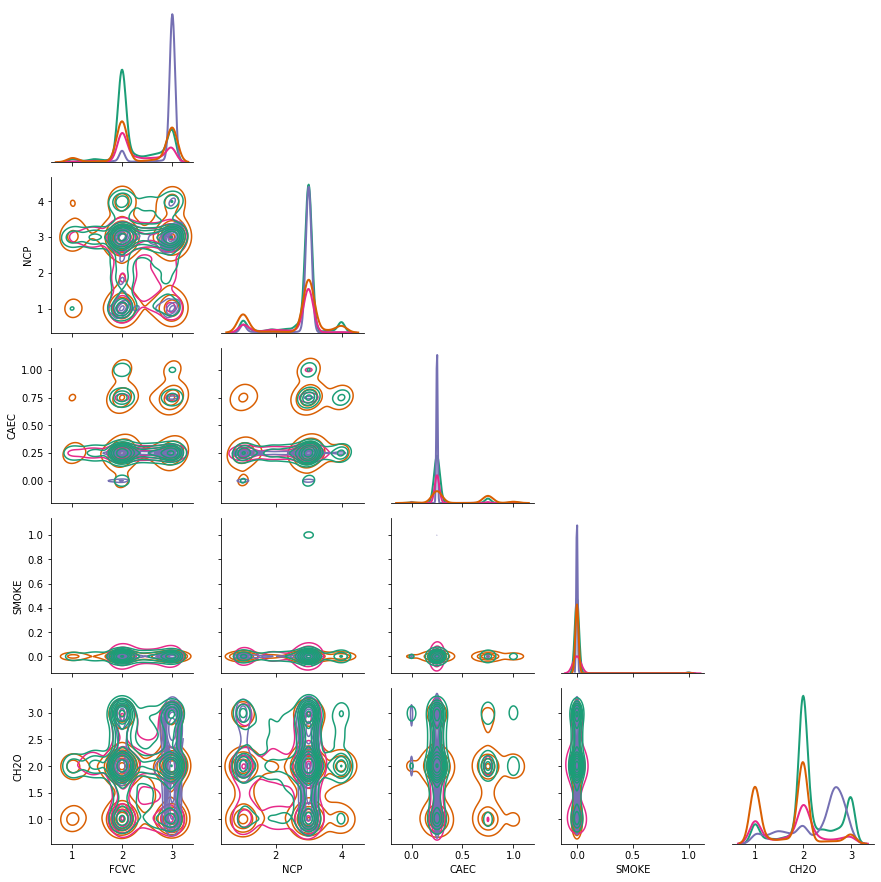

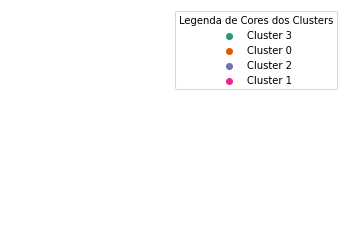

In [54]:
# Criando um mapa de cores baseado na paleta 'Dark2'
palette = sns.color_palette('Dark2', n_colors = len(df_novo['cluster'].unique()))
color_map = dict(zip(df_novo['cluster'].unique(), palette))

# Plotando o gráfico de grid com os clusters e mostrando o mapa de cores
g = sns.PairGrid(df_novo, vars = ['FCVC', 'NCP', 'CAEC', 'SMOKE', 'CH2O'],hue = 'cluster', palette = color_map, diag_sharey = False, corner = True)
g.map_lower(sns.kdeplot)
g.map_diag(sns.kdeplot, lw = 2)
plt.show()

# Mostrando o mapa de cores
for cluster, color in color_map.items():
    plt.scatter([], [], c = [color], label = f'Cluster {cluster}')
plt.legend(title = 'Legenda de Cores dos Clusters')
plt.axis('off')
plt.show()

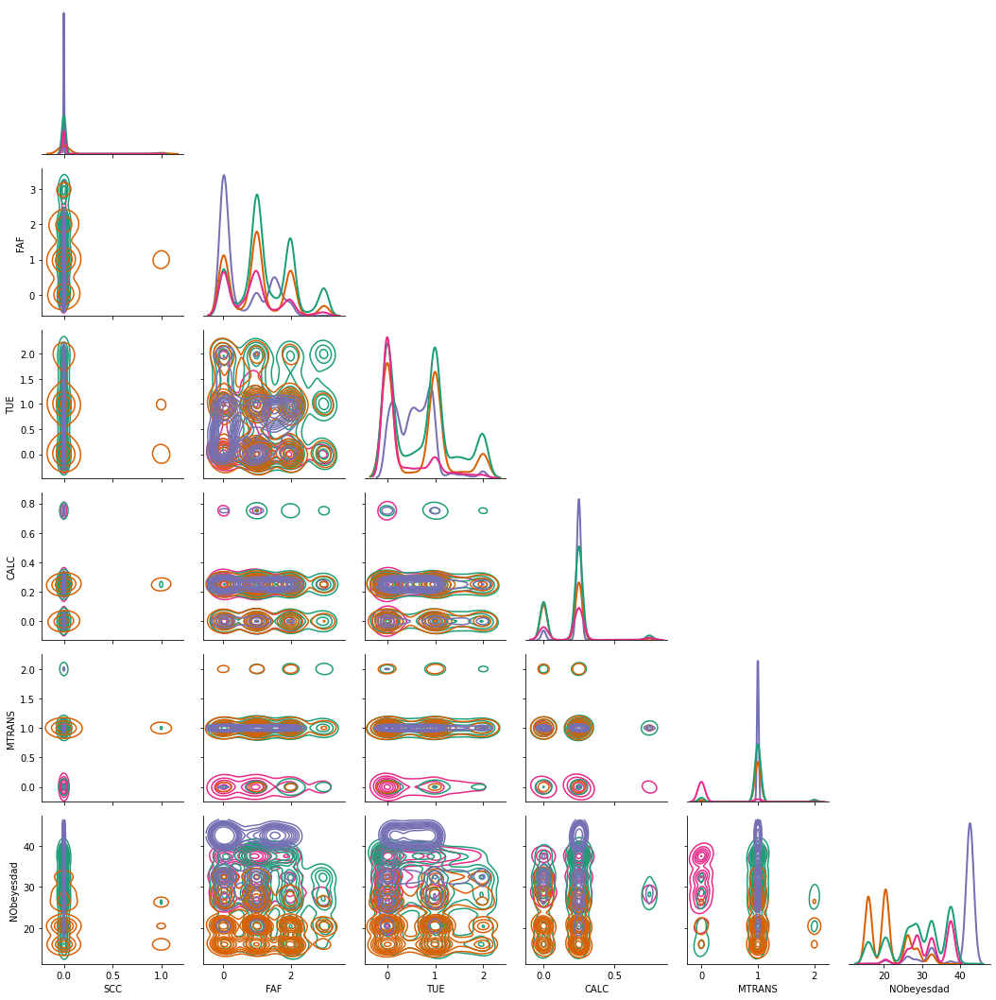

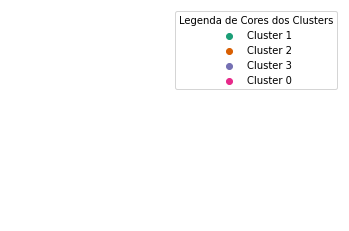

In [44]:
# Criando um mapa de cores baseado na paleta 'Dark2'
palette = sns.color_palette('Dark2', n_colors = len(df_novo['cluster'].unique()))
color_map = dict(zip(df_novo['cluster'].unique(), palette))

# Plotando o gráfico de grid com os clusters e mostrando o mapa de cores
g = sns.PairGrid(df_novo, vars = ['SCC', 'FAF', 'TUE', 'CALC', 'MTRANS', 'NObeyesdad'],hue = 'cluster', palette = color_map, diag_sharey = False, corner = True)
g.map_lower(sns.kdeplot)
g.map_diag(sns.kdeplot, lw = 2)
plt.show()

# Mostrando o mapa de cores
for cluster, color in color_map.items():
    plt.scatter([], [], c = [color], label = f'Cluster {cluster}')
plt.legend(title = 'Legenda de Cores dos Clusters')
plt.axis('off')
plt.show()

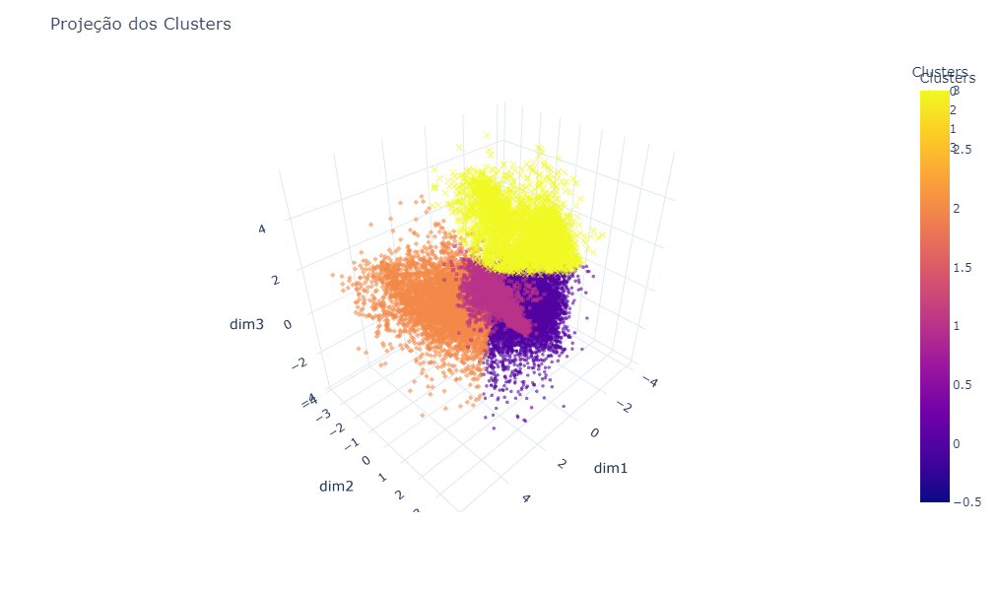

In [110]:
# Plotting the clusters
colors = [
    "#F0810F",  # Orange
    "#063852",  # Blueberry
    "#E6DF44",  # Lemon
    "#800080"   # Purple
]

fig = px.scatter_3d(PCA_df, x='dim1', y='dim2', z='dim3',
              color='Clusters',color_discrete_sequence=colors, opacity=0.6, symbol = 'Clusters')

# Adjust the size of the data points
fig.update_traces(marker=dict(size=2))

fig.update_layout(title="Projeção dos Clusters", height=600, width=800)
fig.show()

## Clusterização - Modelo 2

In [111]:
# Modelo com 3 clusters
modelo_kmeans_3 = KMeans(n_clusters = 3)

In [112]:
# adding the Clusters feature to the PCA dataframe.
PCA_df['Clusters'] = modelo_kmeans_3.fit_predict(PCA_df)

# Treina o modelo e salva o resultado em uma coluna do dataframe original
df_novo['cluster'] = modelo_kmeans_3.fit_predict(PCA_df)

In [113]:
# Amostra aleatória de dados
df_novo.sample(10)

,Gender,Age,Height,family_history_with_overweight,FAVC,FCVC,NCP,CAEC,SMOKE,CH2O,SCC,FAF,TUE,CALC,MTRANS,NObeyesdad,cluster
9242,1,26.000000,1.642572,1,1,3.000000,3.000000,0.25,0,2.623489,0,0.000000,0.123861,0.25,1.0,42.5,1
20406,0,25.000000,1.670000,1,1,2.000000,3.000000,0.75,0,2.000000,0,0.000000,1.000000,0.25,1.0,20.5,2
12696,0,22.980221,1.790172,1,1,2.000000,3.000000,0.25,0,2.035954,0,0.008013,0.503896,0.25,1.0,32.5,2
257,0,18.000000,1.600000,1,1,2.000000,3.000000,0.75,0,2.000000,0,1.000000,1.000000,0.00,1.0,20.5,0
7078,1,17.000000,1.700000,1,0,3.000000,4.000000,0.75,0,2.000000,1,2.000000,1.000000,0.25,1.0,16.0,0
2099,0,24.443011,1.859056,1,1,2.328469,2.658837,0.25,0,2.487070,0,0.742113,0.000000,0.25,0.0,37.5,2
16674,1,19.735968,1.567756,0,0,3.000000,3.000000,0.75,0,1.000000,0,1.000000,0.000000,0.25,1.0,16.0,0
20432,1,25.953830,1.629225,1,1,3.000000,3.000000,0.25,0,2.858171,0,0.000000,0.552006,0.25,1.0,42.5,1
17907,1,18.000000,1.610000,0,1,3.000000,3.000000,0.25,0,1.000000,0,0.000000,1.000000,0.25,1.0,20.5,0
8084,0,37.936044,1.696423,1,1,2.450784,1.874532,0.25,0,2.633858,0,1.666965,0.105408,0.25,0.0,32.5,2


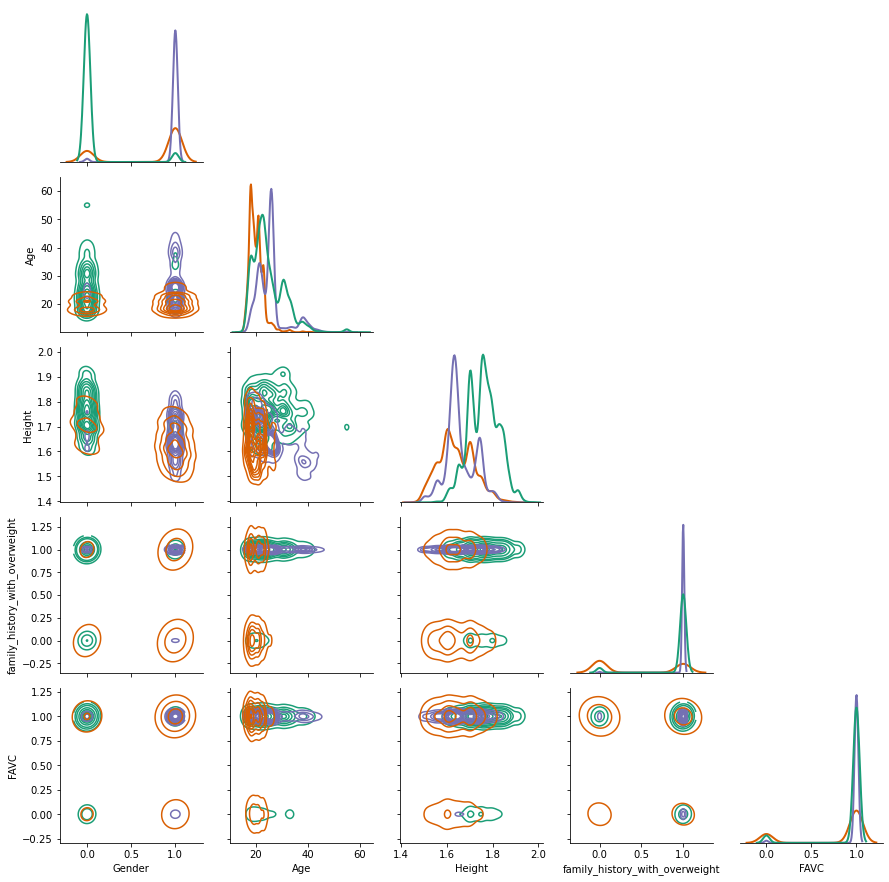

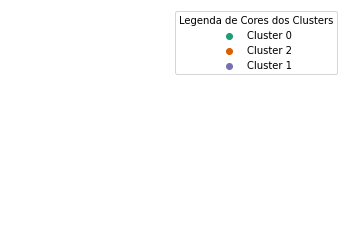

In [58]:
# Criando um mapa de cores baseado na paleta 'Dark2'
palette = sns.color_palette('Dark2', n_colors = len(df_novo['cluster'].unique()))
color_map = dict(zip(df_novo['cluster'].unique(), palette))

# Plotando o gráfico de grid com os clusters e mostrando o mapa de cores
g = sns.PairGrid(df_novo, vars = ['Gender', 'Age', 'Height', 'family_history_with_overweight', 'FAVC'],hue = 'cluster', palette = color_map, diag_sharey = False, corner = True)
g.map_lower(sns.kdeplot)
g.map_diag(sns.kdeplot, lw = 2)
plt.show()

# Mostrando o mapa de cores
for cluster, color in color_map.items():
    plt.scatter([], [], c = [color], label = f'Cluster {cluster}')
plt.legend(title = 'Legenda de Cores dos Clusters')
plt.axis('off')
plt.show()

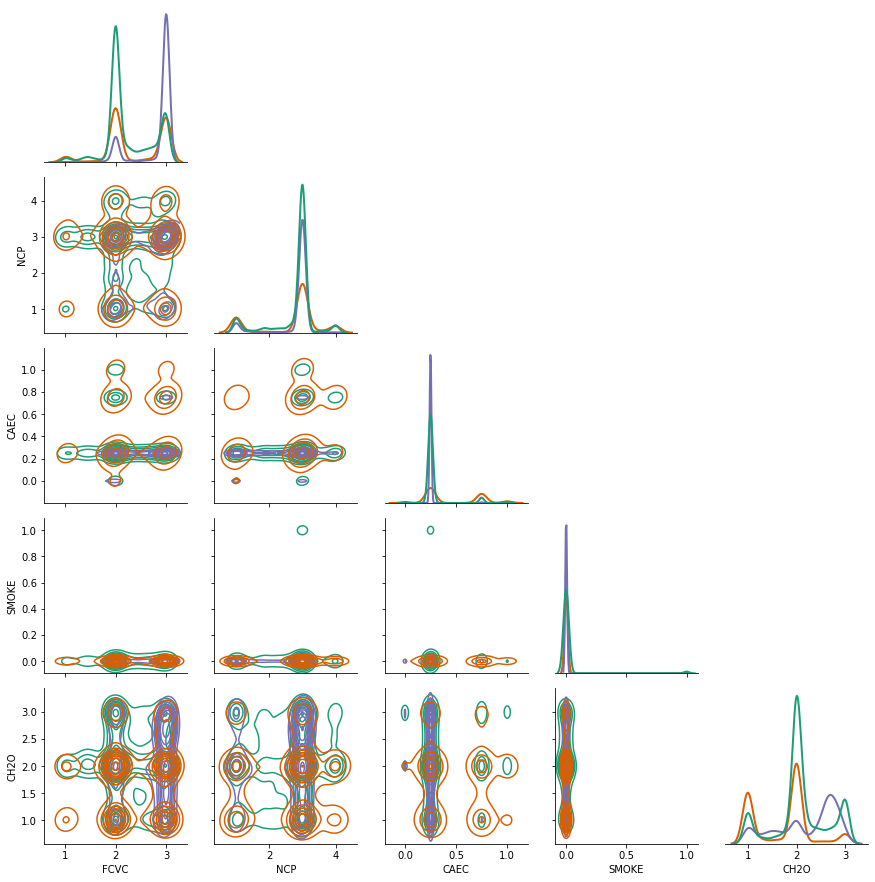

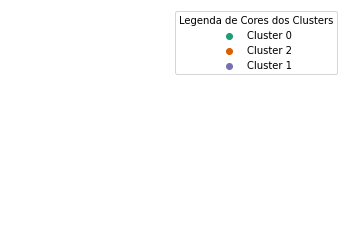

In [59]:
# Criando um mapa de cores baseado na paleta 'Dark2'
palette = sns.color_palette('Dark2', n_colors = len(df_novo['cluster'].unique()))
color_map = dict(zip(df_novo['cluster'].unique(), palette))

# Plotando o gráfico de grid com os clusters e mostrando o mapa de cores
g = sns.PairGrid(df_novo, vars = ['FCVC', 'NCP', 'CAEC', 'SMOKE', 'CH2O'],hue = 'cluster', palette = color_map, diag_sharey = False, corner = True)
g.map_lower(sns.kdeplot)
g.map_diag(sns.kdeplot, lw = 2)
plt.show()

# Mostrando o mapa de cores
for cluster, color in color_map.items():
    plt.scatter([], [], c = [color], label = f'Cluster {cluster}')
plt.legend(title = 'Legenda de Cores dos Clusters')
plt.axis('off')
plt.show()

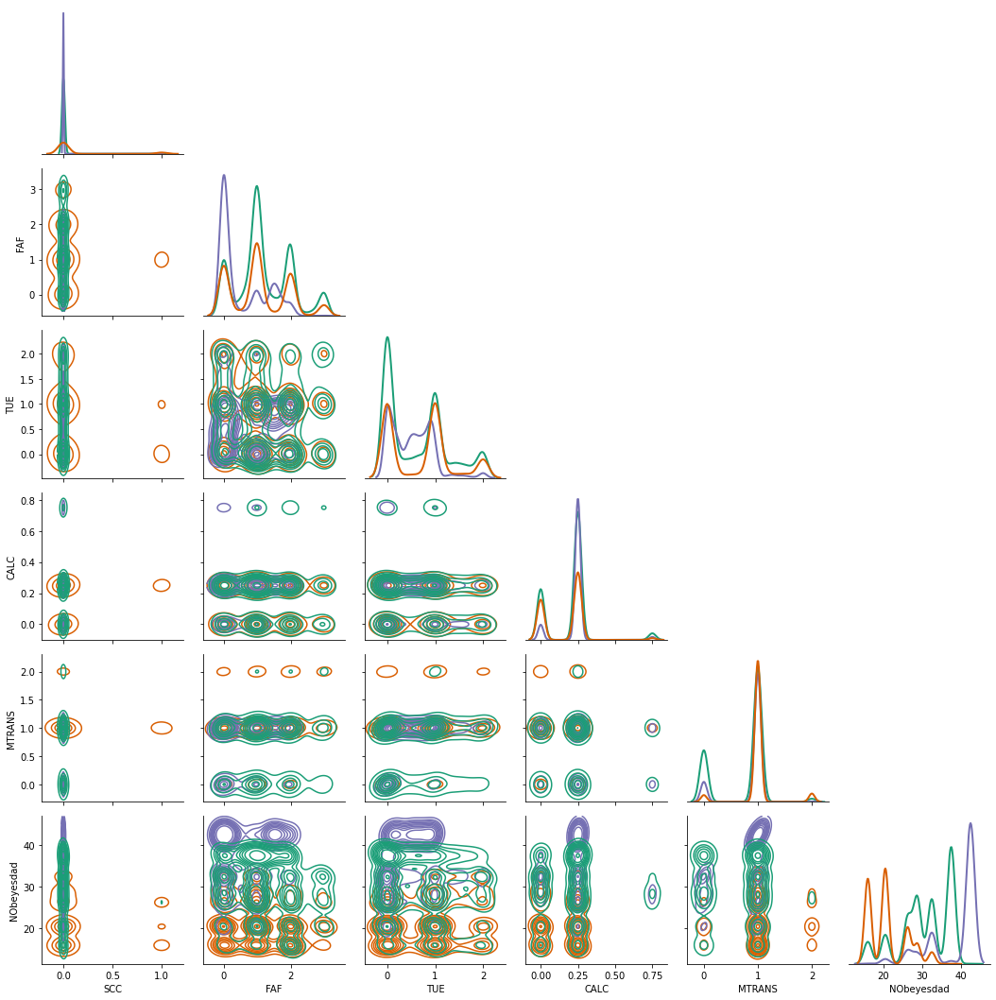

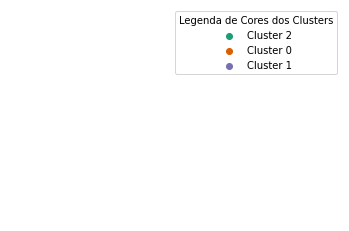

<Figure size 432x288 with 0 Axes>

In [151]:
# Criando um mapa de cores baseado na paleta 'Dark2'
palette = sns.color_palette('Dark2', n_colors = len(df_novo['cluster'].unique()))
color_map = dict(zip(df_novo['cluster'].unique(), palette))

# Plotando o gráfico de grid com os clusters e mostrando o mapa de cores
g = sns.PairGrid(df_novo, vars = ['SCC', 'FAF', 'TUE', 'CALC', 'MTRANS', 'NObeyesdad'],hue = 'cluster', palette = color_map, diag_sharey = False, corner = True)
g.map_lower(sns.kdeplot)
g.map_diag(sns.kdeplot, lw = 2)
plt.show()

# Mostrando o mapa de cores
for cluster, color in color_map.items():
    plt.scatter([], [], c = [color], label = f'Cluster {cluster}')
plt.legend(title = 'Legenda de Cores dos Clusters')
plt.axis('off')
plt.show()
plt.savefig('JointPlot_Clusters_Modelo2.png', bbox_inches='tight')

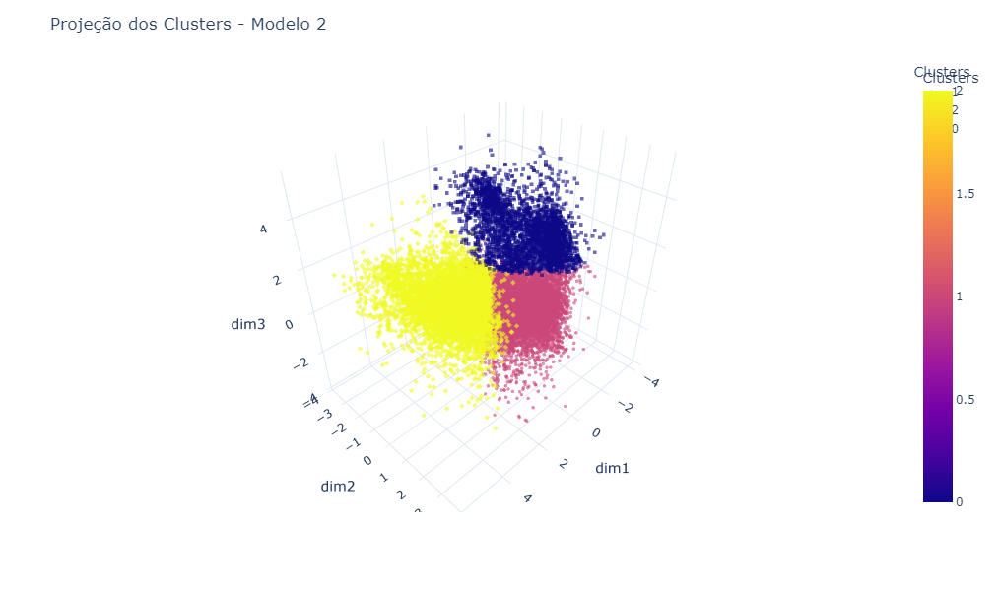

In [150]:
# Plotting the clusters
colors = [
    "#F0810F",  # Orange
    "#063852",  # Blueberry
    "#E6DF44",  # Lemon
    "#800080"   # Purple
]

fig = px.scatter_3d(PCA_df, x='dim1', y='dim2', z='dim3',
              color='Clusters',color_discrete_sequence=colors, opacity=0.6, symbol = 'Clusters')

# Adjust the size of the data points
fig.update_traces(marker=dict(size=2))

fig.update_layout(title="Projeção dos Clusters - Modelo 2", height=600, width=800)
fig.show()

## Perfis dos pacientes

In [149]:
df_novo.groupby('cluster').mean()

,Gender,Age,Height,family_history_with_overweight,FAVC,FCVC,NCP,CAEC,SMOKE,CH2O,SCC,FAF,TUE,CALC,MTRANS,NObeyesdad
cluster,,,,,,,,,,,,,,,,
0,0.745887,20.160183,1.643186,0.428827,0.784692,2.367294,2.668359,0.463430,0.006438,1.726280,0.106760,1.073076,0.700218,0.165951,1.009835,21.044841
1,0.981209,25.529363,1.659689,0.994192,0.985992,2.820214,2.811470,0.252733,0.002050,2.214477,0.000854,0.537010,0.509570,0.235480,0.867270,38.555091
2,0.053879,24.992564,1.760106,0.945905,0.948168,2.257729,2.785553,0.283486,0.020905,2.094469,0.008836,1.205797,0.634804,0.199219,0.743211,30.596794


Perfil 0: Majoritariamente mulheres, 20 anos, sem histórico de sobrepeso na família, com hábitos alimentares abaixo do desejável, condições físicas razoáveis e peso normal.

Perfil 1: Homem, 25 anos, com histórico de sobrepeso na família, com hábitos alimentares abaixo do desejável, condições físicas ruins e obesidade tipo 3.

Perfil 2: Mulher, 26 anos, com histórico de sobrepeso na família, com hábitos alimentares abaixo do desejável, condições físicas razoáveis e sobrepeso nível 2.